## Выводы
Модели SARIMAX может и мощнее, но их построение слишком ресурсоемко.

Prophet - модель своеобразная. Она ловит глобальные зависимости, но на их нюансы не обращает внимания. И ее сложно настраивать, так как параметры не очевидны.

Обычный градиентный бустинг показывает хорошие результаты и без сильных ресурсных затрат.

In [164]:
import pandas as pd
import numpy as np
from tqdm import tqdm_notebook

In [3]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error

In [4]:
data = pd.read_csv('Metro_Interstate_Traffic_Volume.csv')

In [5]:
data['date_time'] = pd.to_datetime(data['date_time'])

In [6]:
data.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
0,None,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545
1,None,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516
2,None,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767
3,None,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026
4,None,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48204 entries, 0 to 48203
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   holiday              48204 non-null  object        
 1   temp                 48204 non-null  float64       
 2   rain_1h              48204 non-null  float64       
 3   snow_1h              48204 non-null  float64       
 4   clouds_all           48204 non-null  int64         
 5   weather_main         48204 non-null  object        
 6   weather_description  48204 non-null  object        
 7   date_time            48204 non-null  datetime64[ns]
 8   traffic_volume       48204 non-null  int64         
dtypes: datetime64[ns](1), float64(3), int64(2), object(3)
memory usage: 3.3+ MB


In [8]:
data.describe()

,temp,rain_1h,snow_1h,clouds_all,traffic_volume
count,48204.000000,48204.000000,48204.000000,48204.000000,48204.000000
mean,281.205870,0.334264,0.000222,49.362231,3259.818355
std,13.338232,44.789133,0.008168,39.015750,1986.860670
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,272.160000,0.000000,0.000000,1.000000,1193.000000
50%,282.450000,0.000000,0.000000,64.000000,3380.000000
75%,291.806000,0.000000,0.000000,90.000000,4933.000000
max,310.070000,9831.300000,0.510000,100.000000,7280.000000


In [9]:
data = data.drop(['rain_1h', 'snow_1h', 'clouds_all', 'weather_main', 'weather_description'], axis=1)

In [10]:
data.head()

,holiday,temp,date_time,traffic_volume
0,None,288.28,2012-10-02 09:00:00,5545
1,None,289.36,2012-10-02 10:00:00,4516
2,None,289.58,2012-10-02 11:00:00,4767
3,None,290.13,2012-10-02 12:00:00,5026
4,None,291.14,2012-10-02 13:00:00,4918


Проверим наличие дубликатов.

In [11]:
data.duplicated().unique()

array([False,  True])

In [12]:
data = data.drop_duplicates()

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40653 entries, 0 to 48203
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   holiday         40653 non-null  object        
 1   temp            40653 non-null  float64       
 2   date_time       40653 non-null  datetime64[ns]
 3   traffic_volume  40653 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 1.6+ MB


In [14]:
data.head()

,holiday,temp,date_time,traffic_volume
0,None,288.28,2012-10-02 09:00:00,5545
1,None,289.36,2012-10-02 10:00:00,4516
2,None,289.58,2012-10-02 11:00:00,4767
3,None,290.13,2012-10-02 12:00:00,5026
4,None,291.14,2012-10-02 13:00:00,4918


In [15]:
import plotly.express as px

In [16]:
fig = px.line(data, x='date_time', y="traffic_volume")
fig.show()

Виден большой пропуск в данных. Так как данных достаточно, отбросим данные после пропуска в данных.

In [17]:
border = pd.Timestamp(year=2015, month=6,day=25, hour=5)

In [18]:
data = data[data['date_time'] > border]

In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26701 entries, 16001 to 48203
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   holiday         26701 non-null  object        
 1   temp            26701 non-null  float64       
 2   date_time       26701 non-null  datetime64[ns]
 3   traffic_volume  26701 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 1.0+ MB


In [20]:
fig = px.line(data, x='date_time', y="traffic_volume")
fig.show()

Теперь необходимо заполнить оставшиеся пропуски. Построим сетку из индексов необходимых значений и сольем с исходными данными.

In [21]:
delta_border = pd.Timedelta(hours=1)

In [22]:
index_data = pd.DataFrame(pd.date_range(start=data['date_time'].min(), end=data['date_time'].max(),
                                      freq=delta_border), columns=['date_time'])

In [23]:
index_data = index_data.set_index('date_time')

In [24]:
data = data.set_index('date_time')

In [25]:
full_data = data.join(index_data, how='outer')

In [26]:
full_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 28697 entries, 2015-06-25 13:00:00 to 2018-09-30 23:00:00
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   holiday         26701 non-null  object 
 1   temp            26701 non-null  float64
 2   traffic_volume  26701 non-null  float64
dtypes: float64(2), object(1)
memory usage: 896.8+ KB


 Есть пропуск в 3 дня 24-27 октября 2015. Такой пропуск интерполяцией не закрыть. Кроме того, есть участки (например 23-24 июля 2016) с аномально низкими значениями целевой переменной. Возьмем для их заполнения средние значения за неделю до пропуска и через неделю после.

In [27]:
def fill_nans(data: pd.DataFrame, column: str, time_delta: pd.Timedelta) -> pd.DataFrame:
    all_nans = data[data[column].isna()]
    for row in all_nans.index:
        result_value_0 = result_value_1 = 0
        new_index_0 = row - time_delta
        if new_index_0 in data.index:
            result_value_0 = 0 if np.isnan(data.loc[new_index_0, column]) else data.loc[new_index_0, column]

        new_index_1 = row + time_delta
        if new_index_1 in data.index:
            result_value_1 = 0 if np.isnan(data.loc[new_index_1, column]) else data.loc[new_index_1, column]
        result = sum([1 if i > 0 else 0 for i in [result_value_0, result_value_1]])
        result = (result_value_0 + result_value_1)/result
        data.loc[row, column] = result
    return data

In [28]:
full_data = fill_nans(full_data, 'traffic_volume', pd.Timedelta(days=7))

In [29]:
full_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 28697 entries, 2015-06-25 13:00:00 to 2018-09-30 23:00:00
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   holiday         26701 non-null  object 
 1   temp            26701 non-null  float64
 2   traffic_volume  28697 non-null  float64
dtypes: float64(2), object(1)
memory usage: 1.9+ MB


Проверим присутствие даты в словаре праздников присвоим признаку 'holiday' 1, если дата праздничная.

In [30]:
holiday_dict = {pd.Timestamp(year=2015, month=10, day=12): 'Columbus Day',
                pd.Timestamp(year=2016, month=10, day=10): 'Columbus Day',
                pd.Timestamp(year=2017, month=10, day=9): 'Columbus Day',
                pd.Timestamp(year=2015, month=11, day=11): 'Veterans Day',
                pd.Timestamp(year=2016, month=11, day=11): 'Veterans Day',
                pd.Timestamp(year=2017, month=11, day=10): 'Veterans Day',
                pd.Timestamp(year=2015, month=11, day=26): 'Thanksgiving Day',
                pd.Timestamp(year=2016, month=11, day=24): 'Thanksgiving Day',
                pd.Timestamp(year=2017, month=11, day=23): 'Thanksgiving Day',
                pd.Timestamp(year=2015, month=12, day=25): 'Christmas Day',
                pd.Timestamp(year=2016, month=12, day=26): 'Christmas Day',
                pd.Timestamp(year=2017, month=12, day=25): 'Christmas Day',
                pd.Timestamp(year=2016, month=1, day=1): 'New Years Day',
                pd.Timestamp(year=2017, month=1, day=2): 'New Years Day',
                pd.Timestamp(year=2018, month=1, day=1): 'New Years Day',
                pd.Timestamp(year=2016, month=2, day=15): 'Washingtons Birthday',
                pd.Timestamp(year=2017, month=2, day=20): 'Washingtons Birthday',
                pd.Timestamp(year=2018, month=2, day=19): 'Washingtons Birthday',
                pd.Timestamp(year=2015, month=5, day=25): 'Memorial Day',
                pd.Timestamp(year=2016, month=5, day=30): 'Memorial Day',
                pd.Timestamp(year=2017, month=5, day=29): 'Memorial Day',
                pd.Timestamp(year=2018, month=5, day=28): 'Memorial Day',
                pd.Timestamp(year=2015, month=7, day=3): 'Independence Day',
                pd.Timestamp(year=2016, month=7, day=4): 'Independence Day',
                pd.Timestamp(year=2017, month=7, day=4): 'Independence Day',
                pd.Timestamp(year=2018, month=7, day=4): 'Independence Day',
                pd.Timestamp(year=2015, month=8, day=27): 'State Fair',
                pd.Timestamp(year=2016, month=8, day=25): 'State Fair',
                pd.Timestamp(year=2017, month=8, day=24): 'State Fair',
                pd.Timestamp(year=2018, month=8, day=23): 'State Fair',
                pd.Timestamp(year=2015, month=9, day=7): 'Labor Day',
                pd.Timestamp(year=2016, month=9, day=5): 'Labor Day',
                pd.Timestamp(year=2017, month=9, day=4): 'Labor Day',
                pd.Timestamp(year=2018, month=9, day=3): 'Labor Day',
                pd.Timestamp(year=2017, month=1, day=16): 'Martin Luther King Jr Day',
                pd.Timestamp(year=2018, month=1, day=15): 'Martin Luther King Jr Day',
                pd.Timestamp(year=2016, month=1, day=18): 'Martin Luther King Jr Day'}

In [31]:
for row in full_data.index:
    day = holiday_dict.get(row, 0)
    if day != 0:
        full_data.loc[row, 'holiday'] = 1
    else:
        full_data.loc[row, 'holiday'] = 0

Теперь осталось только заполнить признак 'temp'. Используем среднемесячную температуру.

In [32]:
bin_number = 0
value = 0
for line in full_data.index:
    if value != line.month:
        value = line.month
        bin_number += 1
    full_data.loc[line, 'bin'] = bin_number

In [33]:
full_data['temp'] = full_data.groupby(['bin'])['temp'].transform(lambda x: x.fillna(x.mean()))

In [34]:
full_data.drop('bin', axis=1, inplace=True)

In [35]:
full_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 28697 entries, 2015-06-25 13:00:00 to 2018-09-30 23:00:00
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   holiday         28697 non-null  object 
 1   temp            28697 non-null  float64
 2   traffic_volume  28697 non-null  float64
dtypes: float64(2), object(1)
memory usage: 1.9+ MB


In [36]:
fig = px.line(full_data, x=full_data.index, y="traffic_volume")
fig.show()

In [37]:
full_data['weekday'] = full_data.index.day_of_week

Добавим данные о времени, но так чтобы значение часа не оказывало чисто 'арифметического' влияния на результат.

In [38]:
full_data['hour'] = full_data.index.hour
full_data['hour_cos'] = np.cos(2 * np.pi * full_data["hour"] / 23)
full_data['hour_sin'] = np.sin(2 * np.pi * full_data["hour"] / 23)

In [39]:
full_data.head(5)

,holiday,temp,traffic_volume,weekday,hour,hour_cos,hour_sin
date_time,,,,,,,
2015-06-25 13:00:00,0,299.34,5116.0,3,13,-0.917211,-0.398401
2015-06-25 14:00:00,0,299.53,5264.0,3,14,-0.775711,-0.631088
2015-06-25 15:00:00,0,299.90,6122.0,3,15,-0.576680,-0.816970
2015-06-25 16:00:00,0,299.80,6277.0,3,16,-0.334880,-0.942261
2015-06-25 17:00:00,0,299.52,5996.0,3,17,-0.068242,-0.997669


In [40]:
def timeseries_train_test_split(y: pd.Series, X: pd.DataFrame=None, test_points: int=168) -> (pd.DataFrame,
                                                                                     pd.DataFrame,
                                                                                     pd.Series,
                                                                                     pd.Series):
    """
    Performs train-test split with respect to time series structure
    :param X:         x data
    :type X:          pd.DataFrame
    :param y:         y data
    :type y:          pd.Series
    :param test_size: number of test data from the end of series
    :type test_size:  int
    """
    
    test_index = len(y) - test_points
    if X is None:
        y_train = y.iloc[:test_index]
        y_test = y.iloc[test_index:]
        return y_train, y_test
    else:
        X_train = X.iloc[:test_index]
        y_train = y.iloc[:test_index]
        X_test = X.iloc[test_index:]
        y_test = y.iloc[test_index:]
    return X_train, X_test, y_train, y_test

In [47]:
y_train, y_test = timeseries_train_test_split(full_data)

In [48]:
from sklearn.preprocessing import StandardScaler
target_scaler = StandardScaler().fit(np.array(y_train['traffic_volume']).reshape(-1, 1))

y_train_feature = pd.Series(target_scaler.transform(np.array(y_train['traffic_volume']).reshape(-1, 1)).flatten(),
                            index=y_train.index, name='scaled_traffic_volume')
y_train = y_train.drop(['traffic_volume'], axis=1)
y_train = pd.concat([y_train, y_train_feature], axis=1)

y_test_feature = pd.Series(target_scaler.transform(np.array(y_test['traffic_volume']).reshape(-1, 1)).flatten(),
                           index=y_test.index, name='scaled_traffic_volume')
y_test = y_test.drop(['traffic_volume'], axis=1)
y_test = pd.concat([y_test, y_test_feature], axis=1)

In [49]:
def show_results(y_test: pd.Series, prediction: pd.Series) -> None:
    
    plt.figure(figsize=(15, 7))
    error_percent = mean_absolute_percentage_error(np.array(y_test), np.array(prediction))*100
    error = mean_absolute_error(np.array(y_test), np.array(prediction))
    plt.title('\n'.join(["Mean absolute percentage error {0:.2f}%".format(error_percent),
                         "Mean absolute error {0:.2f}".format(error)]))

    plt.plot(y_test.values, 'b', label="actual", linewidth=2.0)
    plt.plot(prediction.values, 'r', label="prediction", linewidth=2.0)
    plt.legend()
    plt.tight_layout()
    plt.grid(True)

# Baseline

В качестве baseline используем среднее значение при группировке по дням недели и часу.

In [50]:
baseline = y_train.groupby(['weekday', 'hour'])['scaled_traffic_volume'].mean()

In [51]:
baseline_unscaled = pd.Series(target_scaler.inverse_transform(np.array(baseline).reshape(-1, 1)).flatten(),
                              index=y_test.index)

In [52]:
y_test_unscaled = pd.Series(target_scaler.inverse_transform(np.array(y_test['scaled_traffic_volume']).reshape(-1, 1)).flatten(),
                              index=y_test.index)

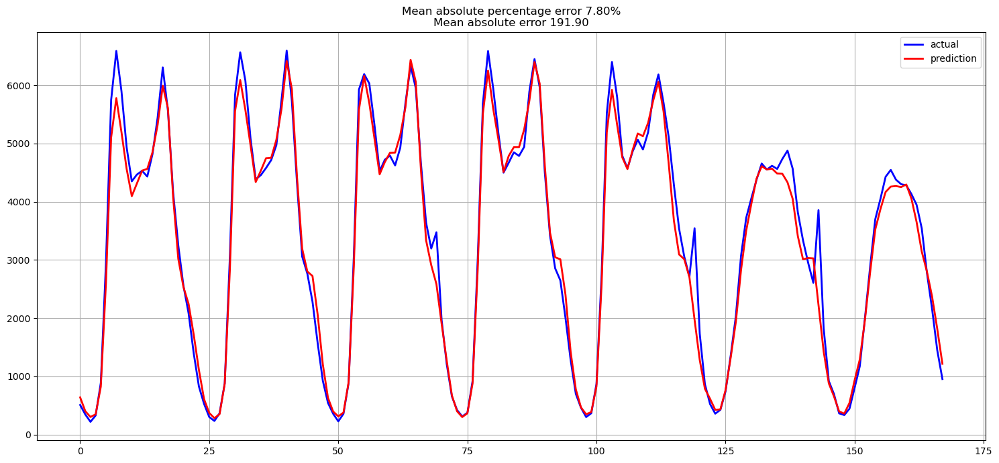

In [53]:
show_results(y_test_unscaled, baseline_unscaled)

# Создадим новые признаки - лаги

In [54]:
def create_lags(df: pd.DataFrame, series_columns: str, end_lag: int) -> pd.DataFrame:
    data = df.copy()
    for c in series_columns:
        for i in range(1, end_lag):
            data["lag_{}_{}".format(c, i)] = data[c].shift(i)
    return data

In [55]:
data_with_lags = create_lags(full_data, ['traffic_volume'], 168)
data_with_lags = data_with_lags.dropna()

/tmp/ipykernel_7952/2390631533.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_7952/2390631533.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_7952/2390631533.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_7952/2390631533.py:5: PerformanceWarn

In [56]:
data_with_lags.head(5)

,holiday,temp,traffic_volume,weekday,hour,hour_cos,hour_sin,lag_traffic_volume_1,lag_traffic_volume_2,lag_traffic_volume_3,...,lag_traffic_volume_158,lag_traffic_volume_159,lag_traffic_volume_160,lag_traffic_volume_161,lag_traffic_volume_162,lag_traffic_volume_163,lag_traffic_volume_164,lag_traffic_volume_165,lag_traffic_volume_166,lag_traffic_volume_167
date_time,,,,,,,,,,,,,,,,,,,,,
2015-07-02 12:00:00,0,295.30,5254.0,3,12,-0.990686,-0.136167,4816.0,4258.0,4419.0,...,2469.0,3189.0,3207.0,3843.0,3971.0,5996.0,6277.0,6122.0,5264.0,5116.0
2015-07-02 13:00:00,0,296.48,5201.0,3,13,-0.917211,-0.398401,5254.0,4816.0,4258.0,...,1507.0,2469.0,3189.0,3207.0,3843.0,3971.0,5996.0,6277.0,6122.0,5264.0
2015-07-02 14:00:00,0,297.07,5601.0,3,14,-0.775711,-0.631088,5201.0,5254.0,4816.0,...,865.0,1507.0,2469.0,3189.0,3207.0,3843.0,3971.0,5996.0,6277.0,6122.0
2015-07-02 15:00:00,0,297.59,5707.0,3,15,-0.576680,-0.816970,5601.0,5201.0,5254.0,...,495.0,865.0,1507.0,2469.0,3189.0,3207.0,3843.0,3971.0,5996.0,6277.0
2015-07-02 16:00:00,0,297.49,5768.0,3,16,-0.334880,-0.942261,5707.0,5601.0,5201.0,...,384.0,495.0,865.0,1507.0,2469.0,3189.0,3207.0,3843.0,3971.0,5996.0


In [67]:
y = data_with_lags['traffic_volume']
X = data_with_lags.drop(['traffic_volume', 'hour'], axis=1)
X_train_unscaled, X_test_unscaled, y_train_unscaled, y_test_unscaled = (
    timeseries_train_test_split(y, X, test_points=168*2))

In [68]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train_unscaled)
X_train = pd.DataFrame(scaler.transform(X_train_unscaled), columns = X_train_unscaled.columns)
X_test = pd.DataFrame(scaler.transform(X_test_unscaled), columns = X_test_unscaled.columns)
target_scaler = StandardScaler().fit(np.array(y_train_unscaled).reshape(-1, 1))
y_train = pd.DataFrame(target_scaler.transform(np.array(y_train_unscaled).reshape(-1, 1)), index=y_train_unscaled.index)
y_test = pd.DataFrame(target_scaler.transform(np.array(y_test_unscaled).reshape(-1, 1)), index=y_test_unscaled.index)

Теперь построим различные модели.

## LinearRegression

In [69]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [70]:
def recursive_predict(model: object, X_test: pd.DataFrame, first_lag_column: int) -> pd.DataFrame:
    horizon = len(X_test)
    
    temp_data = X_test.copy()
    temp_data.iloc[1:, first_lag_column:] = np.nan
    
    predicition = []
    
    for i in range(horizon):
        small_data = pd.DataFrame(temp_data.iloc[i, :]).T
        next_x = model.predict(small_data)[0]
        if i < horizon-1:
            temp_data.iloc[i+1, first_lag_column] = next_x
            temp_data.iloc[i+1, first_lag_column + 1:] = temp_data.iloc[i, first_lag_column:-1].values
        predicition.append(next_x)
    
    return pd.DataFrame(predicition, index=X_test.index, columns=['traffic_volume'])

In [71]:
linear_prediction = recursive_predict(model, X_test, 5)

In [72]:
linear_prediction_unscaled = pd.Series(target_scaler.inverse_transform(np.array(linear_prediction).reshape(-1, 1)).flatten(),
                              index=y_test.index)

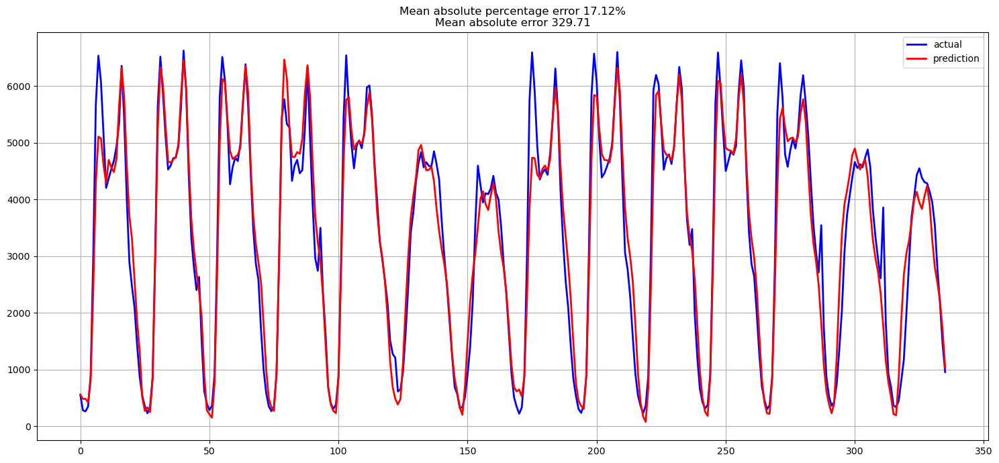

In [73]:
show_results(y_test_unscaled, linear_prediction_unscaled)

Результат даже хуже, чем baseline.

## Lasso

In [74]:
from sklearn.linear_model import LassoCV
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)
lasso = LassoCV(cv=tscv)
lasso.fit(X_train, y_train)

/home/natasha/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:1568: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



LassoCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None))

In [75]:
lasso_prediction = recursive_predict(lasso, X_test, 5)

In [76]:
lasso_prediction_unscaled = pd.Series(target_scaler.inverse_transform(np.array(lasso_prediction).reshape(-1, 1)).flatten(),
                              index=y_test.index)

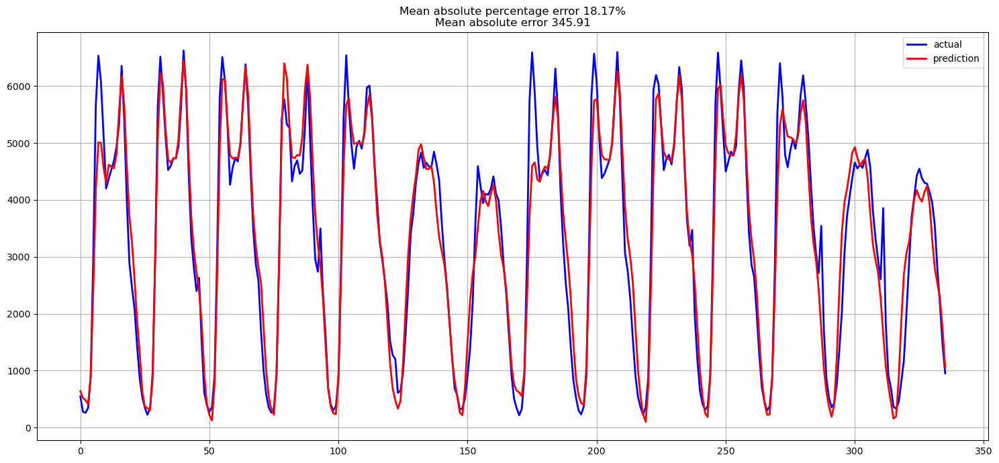

In [77]:
show_results(y_test_unscaled, lasso_prediction_unscaled)

Значение абсолютной ошибки изменилось незначительно, по сравнению с обычной регрессией. Но до baseline еще далеко, поэтому попробуем другие модели.

## GradientBoosting

In [133]:
from sklearn.ensemble import GradientBoostingRegressor
boosting_model = GradientBoostingRegressor(random_state=42,
                                loss='absolute_error',
                                n_estimators=350,
                                max_features=66,
                                subsample=0.7933457,
                                min_samples_split=0.016383,
                                learning_rate=0.07976765,
                                max_depth=20)
boosting_model.fit(X_train_unscaled, y_train_unscaled)

GradientBoostingRegressor(learning_rate=0.07976765, loss='absolute_error',
                          max_depth=20, max_features=66,
                          min_samples_split=0.016383, n_estimators=350,
                          random_state=42, subsample=0.7933457)

In [134]:
boosting_prediction = recursive_predict(boosting_model, X_test_unscaled, 5)

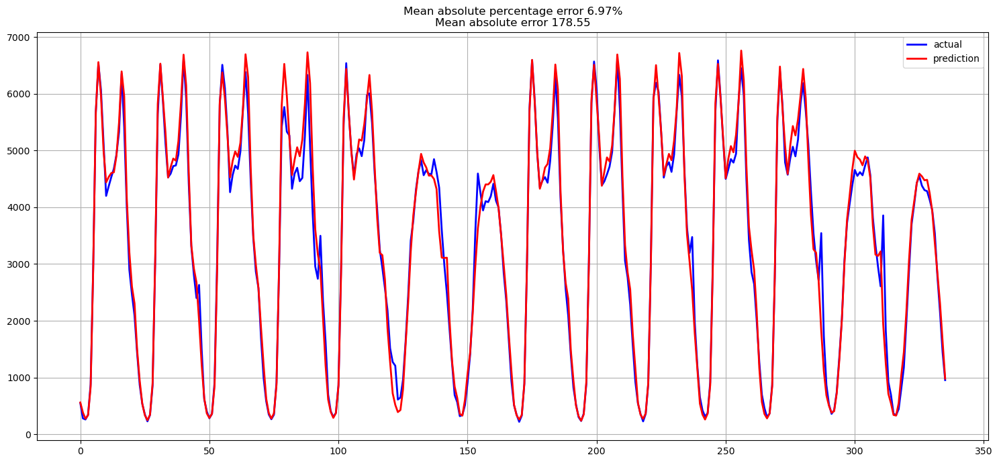

In [135]:
show_results(y_test_unscaled, boosting_prediction)

Здесь результаты уже немного лучше baseline. Модель не описавает выступ на второй половине пиков среды, пятницы и субботы, но их улавливает. Но в остальном видно хорошее совпадение прогноза и теста.

# SARIMAX

In [39]:
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm

In [163]:
y = data_with_lags['traffic_volume']
y = pd.DataFrame(data_with_lags['traffic_volume'], index=pd.to_datetime(np.array(data_with_lags.index)))

y_train, y_test = timeseries_train_test_split(y)

In [164]:
border = pd.Timestamp(year=2018, month=8,day=1, hour=5)

In [165]:
y = y[y.index >= border ]

In [ ]:
p, d, q = 0, 2, 2
P, D, Q = 1, 2, 1
s = 168

data = y_train
model = sm.tsa.statespace.SARIMAX(data, 
                                  order=(p, d, q),
                                  seasonal_order=(P, D, Q, s)).fit()

/home/natasha/anaconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/natasha/anaconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.85660D+00    |proj g|=  7.90482D-02

At iterate    5    f=  7.78658D+00    |proj g|=  6.79511D-03

At iterate   10    f=  7.77786D+00    |proj g|=  1.35086D-03

At iterate   15    f=  7.66781D+00    |proj g|=  2.34024D-01

At iterate   20    f=  7.49901D+00    |proj g|=  7.66842D-02


In [ ]:
Модели получаются очень громоздкие. Загружаем предварительно сохраненную в PyCharm модель.

In [48]:
import joblib

In [49]:
model = joblib.load('sarimax_0-2-2-1-2-1-168.joblib')

In [51]:
start = len(y_train)
end = len(y_train) + len(y_test) - 1
prediction = model.predict(start, end, 
                         typ='linear').rename('Prediction')

In [53]:
forecast_df = pd.Series(np.array(prediction), index = y_test.index)

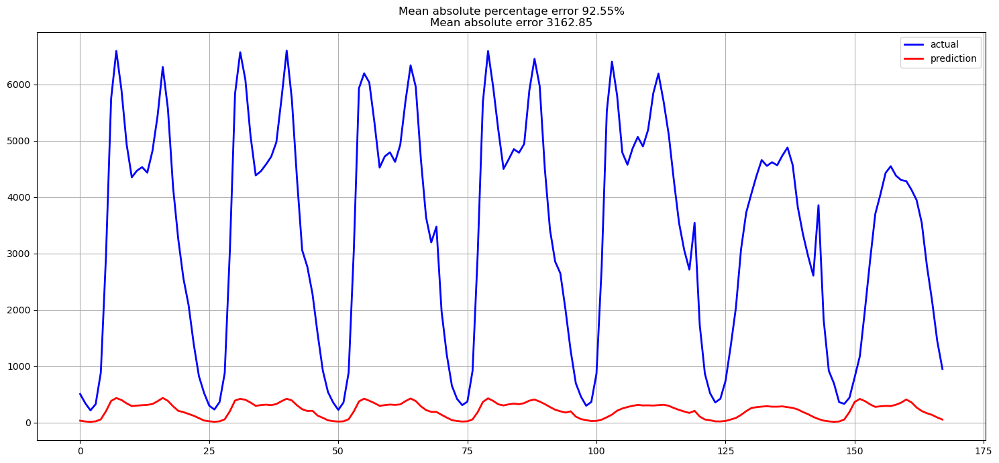

In [54]:
show_results(y_test, forecast_df)

Очевидно, что модель улавливает некоторые изменения сезонности, но подобрать оптимальные значения переметров не представляется возможным: даже на такой сильно урезанной выборке не хватало памяти для стабильной работы оптимизатора optimizer.py.

# Facebook Prophet

In [60]:
# !pip install prophet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 8.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 695.7/695.7 kB 9.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/83.2 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 8.7 MB/s eta 0:00:0000:0100:01m
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 9.1 MB/s eta 0:00:00a 0:00:01m
  Created wheel for pymeeus: filename=PyMeeus-0.5.12-py3-none-any.whl size=731999 sha256=a6fe696bfe95ce8200292b03fd1fd39fa4eec04a41fc5af038f0366ab606f767
  Stored in directory: /home/natasha/.cache/pip/wheels/74/47/c4/678b0a3d5213e2f8500f3ea0f8dc3c81478e5b806c557dff58
Successfully built pymeeus


In [51]:
from prophet import Prophet

In [97]:
y = full_data['traffic_volume']

In [79]:
border = pd.Timestamp(year=2017, month=6,day=1, hour=0)

In [80]:
y = y[y.index >= border]

In [98]:
y

date_time
2015-06-25 13:00:00    5116.0
2015-06-25 14:00:00    5264.0
2015-06-25 15:00:00    6122.0
2015-06-25 16:00:00    6277.0
2015-06-25 17:00:00    5996.0
                        ...  
2018-09-30 19:00:00    3543.0
2018-09-30 20:00:00    2781.0
2018-09-30 21:00:00    2159.0
2018-09-30 22:00:00    1450.0
2018-09-30 23:00:00     954.0
Name: traffic_volume, Length: 28697, dtype: float64

In [99]:
y = pd.DataFrame(y, index=pd.to_datetime(np.array(y.index)))

In [100]:
y['ds'] = y.index

In [101]:
y['y'] = y['traffic_volume']

In [102]:
y = y.drop('traffic_volume', axis=1)

In [103]:
y_train, y_test = timeseries_train_test_split(y)

Параметры для модели подобраны в optimizer_prophet.py.

In [118]:
model = Prophet(daily_seasonality=True,
                weekly_seasonality=True,
                yearly_seasonality=True,
                changepoint_prior_scale=8.7,
                seasonality_prior_scale=31.5,
                holidays_prior_scale=14.5,
            seasonality_mode='multiplicative')
model.add_country_holidays(country_name='US')
model.fit(y_train)

13:38:40 - cmdstanpy - INFO - Chain [1] start processing
13:39:01 - cmdstanpy - INFO - Chain [1] done processing


In [119]:
future = model.make_future_dataframe(periods=168, freq='H')

In [120]:
future.head(3)

,ds
0,2015-06-25 13:00:00
1,2015-06-25 14:00:00
2,2015-06-25 15:00:00


In [121]:
forecast = model.predict(future)

In [122]:
forecast.head(3)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2015-06-25 13:00:00,3175.310320,3931.772308,6162.441725,3175.310320,3175.310320,0.0,0.0,0.0,0.0,...,0.107587,0.107587,0.107587,0.037578,0.037578,0.037578,0.0,0.0,0.0,5067.270564
1,2015-06-25 14:00:00,3175.406734,4275.740667,6499.166746,3175.406734,3175.406734,0.0,0.0,0.0,0.0,...,0.108715,0.108715,0.108715,0.037432,0.037432,0.037432,0.0,0.0,0.0,5410.627803
2,2015-06-25 15:00:00,3175.503148,4544.518111,6671.268533,3175.503148,3175.503148,0.0,0.0,0.0,0.0,...,0.109850,0.109850,0.109850,0.037286,0.037286,0.037286,0.0,0.0,0.0,5656.942665


In [123]:
prediction = forecast[['ds','yhat']]

In [124]:
prediction.head(3)

,ds,yhat
0,2015-06-25 13:00:00,5067.270564
1,2015-06-25 14:00:00,5410.627803
2,2015-06-25 15:00:00,5656.942665


In [125]:
prediction = prediction.set_index('ds')

In [126]:
prediction_df = pd.Series(prediction['yhat'])

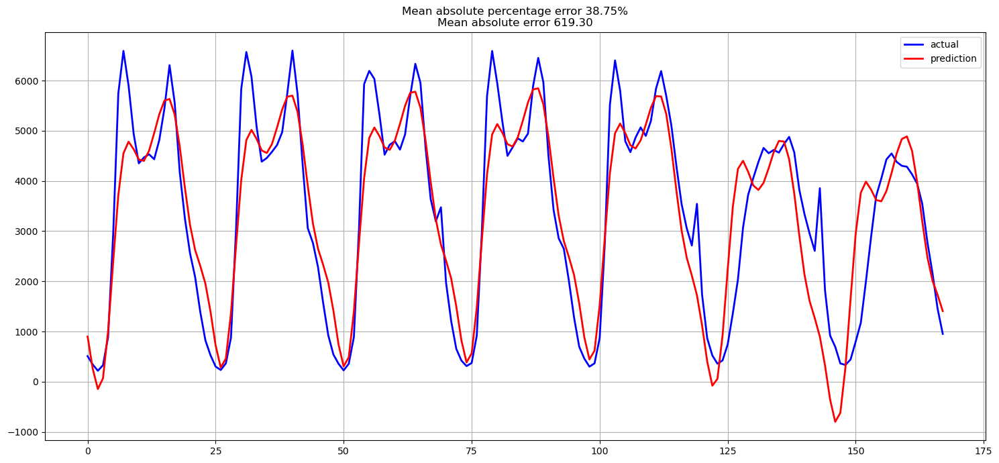

In [127]:
show_results(y_test['y'], prediction_df[-168:])

Данная модель менее требовательна к ресурсам, чем SARIMAX, но и прогноз она дает затухающий и плохо описывающий выходные дни.

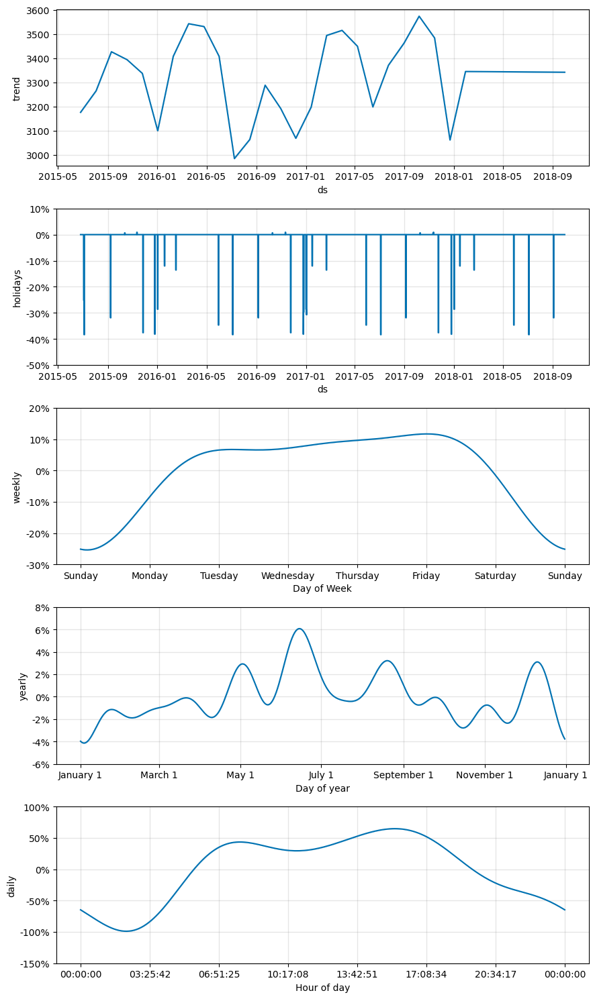

In [128]:
fig = model.plot_components(forecast)

# Построение прогноза

In [140]:
source_data = data_with_lags.drop(['traffic_volume', 'hour'], axis=1)

In [141]:
boosting_forecast = source_data[-1:]

In [142]:
delta_border = pd.Timedelta(hours=1)

In [143]:
source_data.index.max()

Timestamp('2018-09-30 23:00:00')

In [144]:
index_data = pd.DataFrame(pd.date_range(start=source_data.index.max(), end=source_data.index.max()+168*delta_border,
                                      freq=delta_border), columns=['date_time'])

In [145]:
index_data = index_data.set_index('date_time')

In [146]:
boosting_forecast = boosting_forecast.join(index_data, how='outer')

In [147]:
boosting_forecast['holiday'] = 0

In [148]:
boosting_forecast['weekday'] = boosting_forecast.index.day_of_week

In [149]:
boosting_forecast['hour_cos'] = np.cos(2 * np.pi * boosting_forecast.index.hour / 23)
boosting_forecast['hour_sin'] = np.sin(2 * np.pi * boosting_forecast.index.hour / 23)

In [150]:
boosting_forecast['temp'] = boosting_forecast['temp'][0]

In [151]:
boosting_forecast.head(3)

,holiday,temp,weekday,hour_cos,hour_sin,lag_traffic_volume_1,lag_traffic_volume_2,lag_traffic_volume_3,lag_traffic_volume_4,lag_traffic_volume_5,...,lag_traffic_volume_158,lag_traffic_volume_159,lag_traffic_volume_160,lag_traffic_volume_161,lag_traffic_volume_162,lag_traffic_volume_163,lag_traffic_volume_164,lag_traffic_volume_165,lag_traffic_volume_166,lag_traffic_volume_167
date_time,,,,,,,,,,,,,,,,,,,,,
2018-09-30 23:00:00,0,282.12,6,1.000000,-2.449294e-16,1450.0,2159.0,2781.0,3543.0,3947.0,...,4936.0,5900.0,6591.0,5747.0,2954.0,888.0,328.0,219.0,344.0,509.0
2018-10-01 00:00:00,0,282.12,0,1.000000,0.000000e+00,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-10-01 01:00:00,0,282.12,0,0.962917,2.697968e-01,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [152]:
boosting_prediction = recursive_predict(boosting_model, boosting_forecast, 5)

In [154]:
fig = px.line(boosting_prediction, x=boosting_prediction.index, y="traffic_volume")
fig.show()

## Построение доверительного интевала

In [308]:
def recursive_predict_with_noise(model, df_forecast, noise_std=None):
    horizon = len(df_forecast)
    df_pred = df_forecast.copy()
    forecast = []
    lagcols = [f"lag_traffic_volume_{i}" for i in range(1, 168)]
    t = df_forecast.index
    
    feat_cols = df_forecast.columns.tolist()
    
    for i in range(horizon):
        timestamp = t[i]
        features = df_pred.loc[[timestamp]]
        next_x = model.predict(features)[0]
        if noise_std is not None:
            next_x = next_x + np.random.normal(0, noise_std)
        if i < horizon-1:
            next_timestamp = t[i+1]
            df_pred.loc[next_timestamp, lagcols[0]] = next_x
            df_pred.loc[next_timestamp, lagcols[1:]] = df_pred.loc[timestamp, lagcols[:-1]].values
        forecast.append(next_x)
    
    df_pred.loc[:, "traffic_volume"] = forecast
    return df_pred

In [291]:
def sample_bootstrap_forecasts(model, df_forecast, n_samples=100, noise_std=None):    
    df_conf_int = pd.DataFrame(index=df_forecast.index)
    
    for s in tqdm.notebook.tqdm(range(n_samples)):
        df_forecasted = recursive_predict_with_noise(model, df_forecast, noise_std=noise_std)
        df_conf_int["forcast_{}".format(s)] = df_forecasted.traffic_volume.values
    
    return df_conf_int

In [314]:
def plot_samples(df_forc_sample):
    plt.figure(figsize=(14,8))
    for c in df_forc_sample.columns:
        plt.plot(df_forc_sample[c])
    plt.show()

In [161]:
def get_train_forecast_errors(model, X_train, y_train):
    forecast = model.predict(X_train)
    errors = y_train - forecast
    return errors

In [162]:
errors = get_train_forecast_errors(boosting_model, X_train_unscaled, y_train_unscaled)

In [321]:
df_forc_sample = sample_bootstrap_forecasts(boosting_model, boosting_forecast, n_samples=100, noise_std=errors.std())

/tmp/ipykernel_7952/1032393390.py:4: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



  0%|          | 0/100 [00:00<?, ?it/s]

In [322]:
df_forc_sample.sample(3)

,forcast_0,forcast_1,forcast_2,forcast_3,forcast_4,forcast_5,forcast_6,forcast_7,forcast_8,forcast_9,...,forcast_90,forcast_91,forcast_92,forcast_93,forcast_94,forcast_95,forcast_96,forcast_97,forcast_98,forcast_99
date_time,,,,,,,,,,,,,,,,,,,,,
2018-10-04 14:00:00,5197.737591,4609.933954,4907.290359,4992.788571,5011.776437,3407.265009,3367.928166,4956.200396,4134.589933,4222.364270,...,4233.771140,4036.320354,4465.082611,4747.519721,5007.550046,4410.929909,4739.618596,4844.316061,4669.030741,5317.135089
2018-10-05 08:00:00,4862.052525,4861.418373,5246.264719,4957.823896,5373.492950,3832.739575,2761.915104,5543.156888,4794.092828,2494.276287,...,3912.990263,4089.413627,4273.281627,4882.068619,4240.673462,4736.648292,5159.713809,4645.507717,4913.724938,5485.984264
2018-10-06 13:00:00,3904.272261,4174.350428,3800.467464,3128.154694,4757.614029,3846.847325,4074.705021,4400.966987,3726.054937,106.365886,...,3513.187589,4680.494724,4292.566168,3810.426793,4643.072028,4541.465231,4719.610701,3311.640710,3761.041585,4466.321399


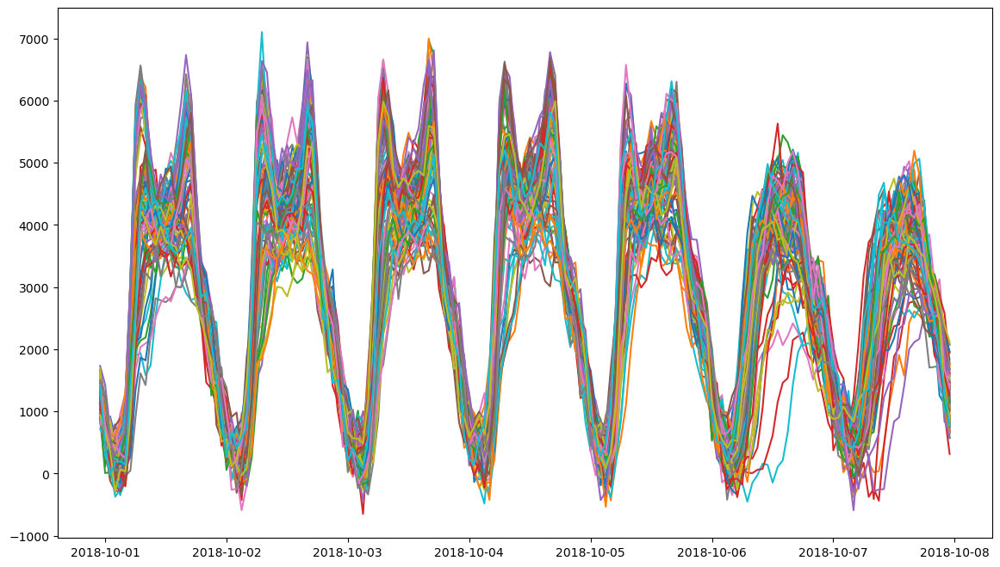

In [323]:
plot_samples(df_forc_sample)

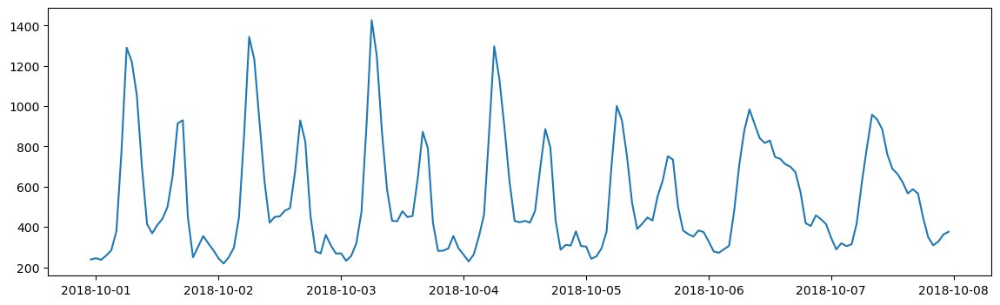

In [324]:
error_std = df_forc_sample.std(axis=1)

plt.figure(figsize=(14,4))
plt.plot(error_std)
plt.show()

In [351]:
def plotRecursivePredictionConfInterval(y_forecast, error_std):
    plt.figure(figsize=(15, 7))
   
    plt.plot(y_forecast.values, "g", label="prediction", linewidth=2.0)
    
    scale = 1
    lower = y_forecast - scale * error_std
    upper = y_forecast + scale * error_std

    plt.plot(lower.values, "r--", label="upper bond / lower bond", alpha=0.5)
    plt.plot(upper.values, "r--", alpha=0.5)
    
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True)

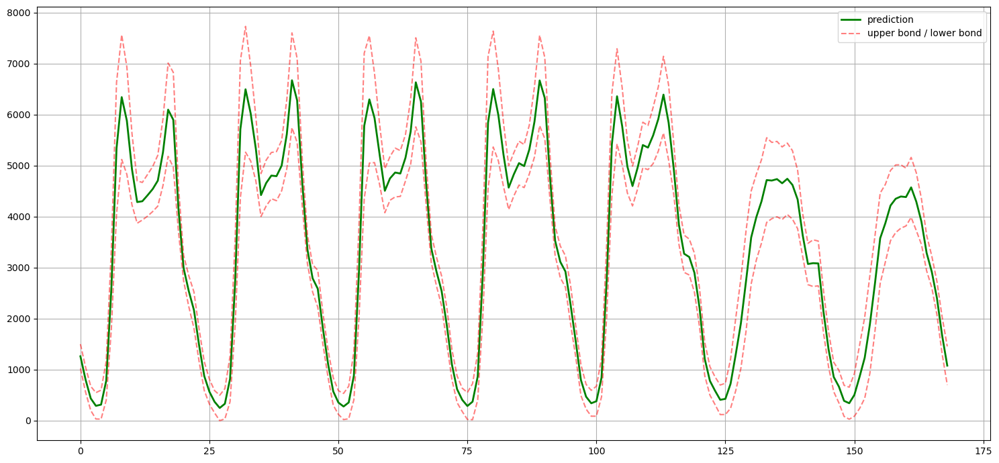

In [352]:
plotRecursivePredictionConfInterval(boosting_prediction.traffic_volume, error_std)